In [1]:
import torch
import numpy as np
from srcnn import SRCNN
from image_reader import ImageReader
from trainer import Trainer
from test_model import test_model,\
  calculate_test_psnr,\
  calculate_test_psnr_with_noise,\
  calculate_test_psnr_with_salt_and_pepper
from create_data_loader import create_data_loader
from model_saver import ModelSaver
from training_loop import training_loop
from plots import plot_noise

In [2]:
image_reader = ImageReader()
validation_images = image_reader.read_val()
test_images = image_reader.read_test()

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = SRCNN().to(device)

In [4]:
model.load_state_dict(torch.load("./saved_models/srcnn3/old"))

<All keys matched successfully>

In [5]:
model_saver = ModelSaver("./saved_models", 36.75, 47)

In [6]:
trainer = Trainer(model, None, create_data_loader(validation_images, validation=True),
  device, model_saver)

In [7]:
training_loop(trainer, image_reader, model_saver,
  epochs=2, already_trained_epochs=47, epochs_per_dataset=2, lr=0.00002)

Actual epoch: 1/2
Dataset 1/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:03:40.0022
Dataset 2/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:03:44.0117
Dataset 3/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:03:53.0531
Dataset 4/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:03:47.0951
Actual epoch: 2/2
Dataset 1/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:03:42.0879
Dataset 2/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:03:42.0664
Dataset 3/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:03:59.0761
Dataset 4/4
Dataset epoch 1/2
Dataset epoch 2/2
Finished dataset in: 00:04:01.0663
Finished in: 00:32:52.0877


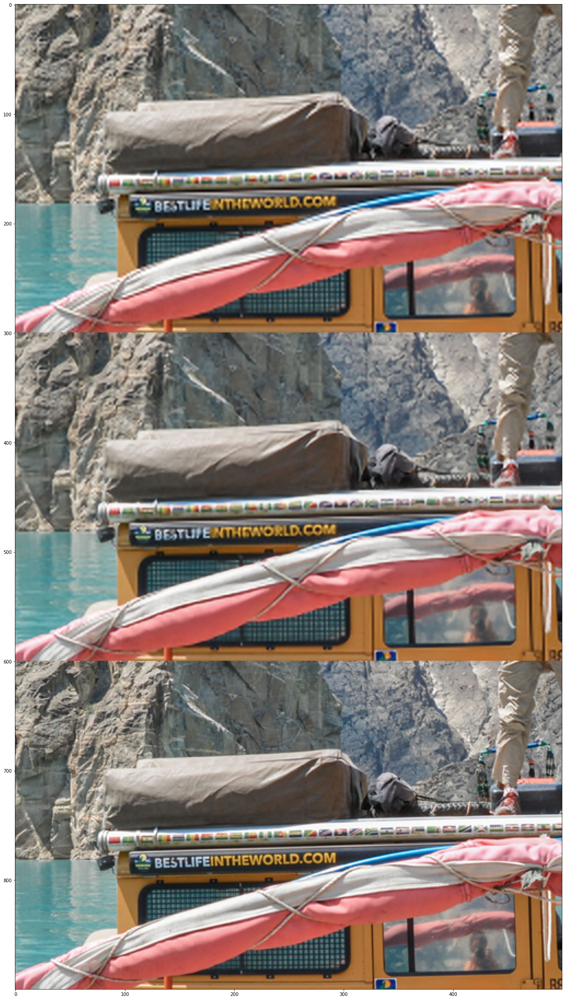

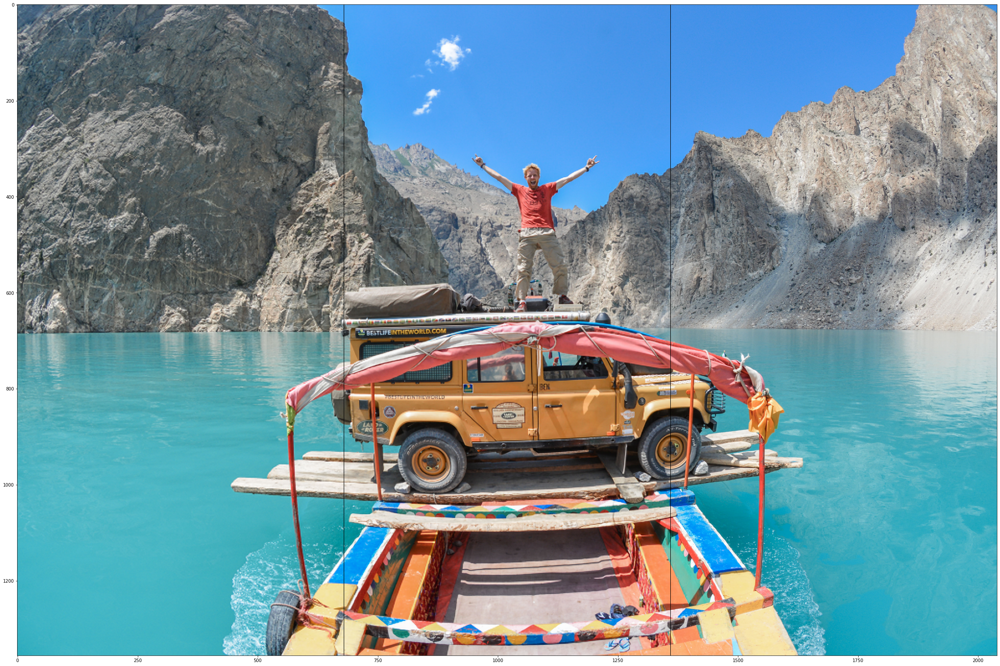

In [8]:
test_model(model, image_reader.read_sample_image(), device)

In [5]:
#36.546
calculate_test_psnr(model, validation_images, device)

'model psnr:36.96929815898741 bicubic psnr:36.93874333525008'

In [5]:
#35.491
calculate_test_psnr(model, test_images, device)

'model psnr:35.99044647286595 bicubic psnr:35.97476682340336'

In [6]:
sample_image = image_reader.read_sample_image()

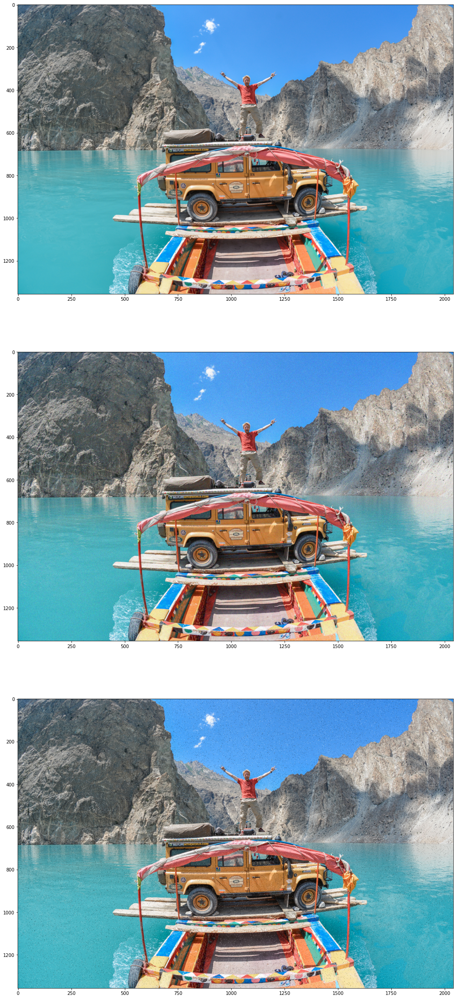

In [7]:
plot_noise(sample_image)

In [9]:
#23.756
calculate_test_psnr_with_noise(model, test_images, device)

'model psnr:25.927462472071706 bicubic psnr:25.111885158625512'

In [10]:
#23.126
calculate_test_psnr_with_salt_and_pepper(model, test_images, device)

'model psnr:23.091220631014522 bicubic psnr:22.54311884236156'

In [ ]:
#torch.save(model.state_dict(), f"./saved_models/srcnn_model")